In [1]:
import cv2


from matplotlib import pyplot as plt

# This opens an inteactive figure - use it in part B
import matplotlib
matplotlib.use('TkAgg')

import matplotlib.pyplot as plt
import numpy as np
from scipy.linalg import null_space

# This specifies the way plots behave in jupyter notebook
%matplotlib inline
plt.rcParams['figure.figsize'] = (8.0, 8.0) # set default size of plots
plt.rcParams['image.cmap'] = 'gray'


import platform
print("Python version: ", platform.python_version())
print("Numpy version: ", np.__version__)

Python version:  3.11.5
Numpy version:  1.24.2


## <span style="color:blue">Patch Matching
**In this part you will match intrest points between two images.**
    
    
There are two functions between vectors $v$ and $u$ that you will consider:\
a. Distance: Sum of Square Distance (SSD). That is,  $SSD(u,v)=(u-v)\cdot(u-v)$.\
b. Similarity: Normalized Cross Correlation (NCC). That is,  $NCC(u,v)={u\cdot v \over ||u||||v||}$.


The patch descriptor:
1. A vector with the pixels' grey level.
2. An histogram (30 bins) of the pixels' grey level.
3. A vector with the pixels' strength gradient.
4. An histogram (30 bins) of the pixels' strength of gradient. 


In [238]:
from scipy.signal import convolve2d

# Calculate the Sum of Squared Differences (SSD)
def SSD(patch_descr_1, patch_descr_2):
    return np.sum((patch_descr_1 - patch_descr_2)**2)

In [239]:
# Calculate the Normalized Cross Correlation (NCC)
def NCC(patch_descr_1, patch_descr_2):
    norm_1 = np.linalg.norm(patch_descr_1)
    norm_2 = np.linalg.norm(patch_descr_2)
    
    # If either patch has zero norm, return 0 to avoid division by zero.
    if norm_1 == 0 or norm_2 == 0:
        return 0 

    # Calculate the Normalized Cross-Correlation (NCC) between the two patches.
    return np.dot(patch_descr_1, patch_descr_2) / (norm_1 * norm_2)

In [240]:
# patch descriptor - A vector with the pixels' grey level.
def patch_from_im(im, p, patch_size):
    # Convert the patch center point 'p' to a numpy array if it's a tuple.
    if type(p) == tuple:
        p = np.array(p)
    
    # Extract the x and y coordinates of the patch center.
    y, x = p

    # Calculate the half size of the patch to use for slicing.
    dist = patch_size // 2

    # Slice the image to get the patch and reshape it into a vector.
    patch_vector = im[x-dist:x+dist+1, y-dist:y+dist+1].reshape(1,-1)
    return patch_vector

In [241]:
# patch descriptor - An histogram (30 bins) of the pixels' grey level
def hist_patch_im(im, p, patch_size):
    # Extract a patch from the image.
    patch = patch_from_im(im, p, patch_size)

    # Compute a histogram of the patch intensities with 30 bins ranging from 0 to 256.
    hist = np.histogram(patch, bins=30, range=(0, 256))[0]
    return hist

In [242]:
# patch descriptor - A vector with the pixels' strength gradient.
def gradient(im, p, patch_size):
    # Create a meshgrid for gradient computation, centered at zero.
    ax = np.linspace(-(patch_size - 1) / 2, (patch_size - 1) / 2, patch_size)
    xx, yy = np.meshgrid(ax, ax)

    # Compute the gradients in x and y directions using convolution.
    grad_x = convolve2d(im, xx, mode='same')
    grad_y = convolve2d(im, yy, mode='same')

    # Calculate the gradient magnitude.
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)

    # Extract the patch from the gradient magnitude image.
    patch_gradient = patch_from_im(gradient_magnitude, p, patch_size)

    # Return the flattened patch.
    return patch_gradient

In [243]:
# patch descriptor - An histogram (30 bins) of the pixels' strength of gradient.
def hist_gradient(im, p, patch_size):
    # Compute the gradient and flatten it into a vector.
    patch_gradient = gradient(im, p, patch_size).flatten()

    # Compute a histogram of the gradient magnitudes with 30 bins.
    patch_gradient_histogram = np.histogram(patch_gradient, bins=30, range=(0, np.max(patch_gradient)), density=True)[0]
    return patch_gradient_histogram

**Apply and answer**


1. Compute the corners in a pair of images (e.g., view0.tif and view6.tif).


2. Choose up to 2000 of the strongest corners (you can use fewer) and find a matching between the corners in the pair of images.
    * Choose a fixed scale and use it to define a patch around each corner.
    * To display the matching, use the function cv2.hconcat([im1, im2]), which concatenates two images horizontally, and then draw lines as described in the previous section.


3. Use up to 4000 of the strongest corners (you can use fewer) in each image and use the matching only between corners that have approximately the same y-coordinate (up to a threshold).


4. Study the ratio for matching between the best and the second best match. 
   * You can use NCC or SSD on the desriptor of your choice.
   * You can use without (2) or with (3) the $y$-coordinate constraint.
   * **Present** examples that demonstrate the effectiveness of using the ratio.


5. Study the differences between the different descriptors and also the use of SSD or NCC. 
   * **Present**  examples that demonstrate your findings.


6. Identify incorrect pairs of matched points.\
   **Mark and display** for cases (2), (3), and (4) a pair of incorrectly matched points.\
   **Answer**\
   a. In which of the 3 cases are there more incorrect matches?\
   b. What may be the reason for the incorrect matches?


7. In which regions of the scene were most of the reliable matches found?



**Implementation details**

You can compute the NCC or SSD patch by patch. This will probably takes longer than using matrix multiplications of numpy.

Using matrices:
1. Generate a 1D vector from each descriptor.


2. Generate a matrix $M_1$:  rows  are  the descriptors of img1.


3. Generate a matrix $M_2$:  columns  are  the descriptors of img2.


4. $M=np.matmul(M_1,M_2)$\
   * what is the value in $M(i,j)$?


5. Think of how to normalize the set of patches, if you need.
   * You can consider using the function np.diag(np.diag(matrix)) as part of your solution.
    
    

**Section B Question 1**
1. Compute the corners in a pair of images (e.g., view0.tif and view6.tif).

In [244]:
## harris cornerr detector from HW1. 
from scipy.signal import convolve2d
def H_corner(img, sigma_smooth, sigma_neighb, th, density_size, display=False, k=0.04):
    # Compute Derivative of Gaussian Kernels
    kernel_size = int(6 * sigma_smooth + 1)
    if kernel_size % 2 == 0:
        kernel_size += 1  # Ensure kernel size is odd

    ax = np.linspace(-(kernel_size - 1) / 2, (kernel_size - 1) / 2, kernel_size)
    x, y = np.meshgrid(ax,ax)

    #Calculat the gausian derivation
    Gauss = (1/(2*np.pi*sigma_smooth**2))*np.exp(-(np.square(x) + np.square(y))/(2*sigma_smooth**2))
    G_dx = Gauss * ((-x) / sigma_smooth**2)
    G_dy = Gauss * ((-y) / sigma_smooth**2)

    # Compute two matrixes, I_x and I_y - Image Derivatives
    I_x = convolve2d(img, G_dx, mode='same')
    I_y = convolve2d(img, G_dy, mode='same')

    #Compute matrices: C11, C12, C22,  each corresponds to a different entry of the matrix for C
    #convolving the matrices computed in Grad_xy with a Gaussian defined by $\sigma_{neighb}$
    GaussianKernel = cv2.getGaussianKernel(kernel_size, sigma_neighb, cv2.CV_64F)
    GaussianKernel = GaussianKernel.dot(GaussianKernel.T)  # Create a 2D Gaussian kernel
    C11 = convolve2d(I_x ** 2, GaussianKernel, mode='same')
    C12 = convolve2d(I_x * I_y, GaussianKernel, mode='same')
    C22 = convolve2d(I_y ** 2, GaussianKernel, mode='same')

    #Compute $d(q)= det(C)-k\cdot Trace(C)^2$.
    det_C = C11 * C22 - C12 ** 2
    trace_C = C11 + C22
    d_q = det_C - k * (trace_C ** 2)

    #Apply Threshold
    d_q_pre_threshold = d_q.copy()
    d_q[d_q < th] = 0

    # Perform non-maximum suppression
    corners = []
    for i in range(density_size, d_q.shape[0] - density_size):
        for j in range(density_size, d_q.shape[1] - density_size):
            region = d_q[i-density_size:i+density_size+1, j-density_size:j+density_size+1]
            if d_q[i, j] == np.max(region) and d_q[i, j] > 0:
                corners.append(((j, i), d_q[i, j]))  # (coordinates, strength)
    # We couldn't find a more efficient way to compute it vectorized without using loops

    # Return and Display Results
    if display:
        plt.figure(figsize=(15, 10))
        plt.subplot(231), plt.imshow(img, cmap='gray'), plt.title('Original Image')
        plt.subplot(232), plt.imshow(I_x, cmap='gray'), plt.title('Ix')
        plt.subplot(233), plt.imshow(I_y, cmap='gray'), plt.title('Iy')
        plt.subplot(234), plt.imshow(d_q_pre_threshold, cmap='gray'), plt.title('Corner Strength (Before Threshold)')
        plt.subplot(235), plt.imshow(d_q, cmap='gray'), plt.title('Corner Strength (After Threshold)')
        plt.subplot(236), plt.imshow(img, cmap='gray'), plt.title('Detected Corners')
        if corners:
            corners_arr = np.array([coord for coord, _ in corners])
            plt.scatter(corners_arr[:, 0], corners_arr[:, 1], s=5, c='r', marker='o')
        plt.show()


    return corners

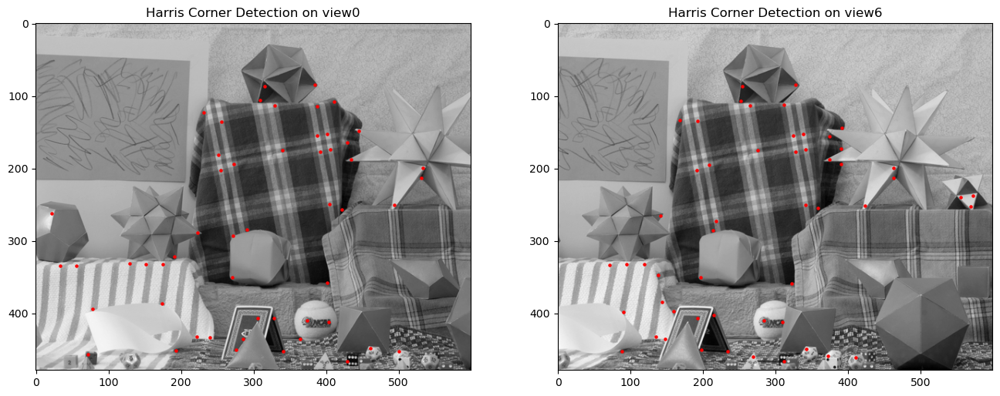

In [353]:
img1_path = 'images/view0.tif'
img2_path = 'images/view6.tif'

img_1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
img_2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

corners_1 = H_corner(img_1, sigma_smooth=3, sigma_neighb=2, th=100, density_size=10, k=0.06)
corners_2 = H_corner(img_2, sigma_smooth=3, sigma_neighb=2, th=100, density_size=10, k=0.06)

plt.subplot(1,2,1)
plt.imshow(img_1, cmap='gray')
if corners_1:
    corners_arr_1 = np.array([coord for coord, _ in corners_1])
    plt.scatter(corners_arr_1[:, 0], corners_arr_1[:, 1], s=5, c='r', marker='o')
plt.title('Harris Corner Detection on view0')

plt.subplot(1,2,2)
plt.imshow(img_2, cmap='gray')
if corners_2:
    corners_arr_2 = np.array([coord for coord, _ in corners_2])
    plt.scatter(corners_arr_2[:, 0], corners_arr_2[:, 1], s=5, c='r', marker='o')
plt.title('Harris Corner Detection on view6')
plt.show()

**Section B Question 2**

Choose up to 2000 of the strongest corners (you can use fewer) and find a matching between the corners in the pair of images.
    * Choose a fixed scale and use it to define a patch around each corner.
    * To display the matching, use the function cv2.hconcat([im1, im2]), which concatenates two images horizontally, and then draw lines as described in the previous section.


In [354]:
def filterd_corners(img, patch_size):
    img_high, img_width = img.shape
    #find a list of corners in both images using HW1
    corners = H_corner(img, sigma_smooth=3, sigma_neighb=2, th=100, density_size=10, k=0.06)
    corners = [corner[0] for corner in corners]
    #handle end efectation
    corners = [(x, y) for x, y in corners if (x > (patch_size//2 +1) and x < (img_width - patch_size//2 -1)) and
                (y > (patch_size//2 +1) and y < (img_high - patch_size//2 - 1))]
    return corners

In [355]:
def create_patch_matrix(im, corners, patch_size, descriptor='patch_im'):
    # Initialize an empty matrix
    if descriptor == 'patch_im' or descriptor == 'grad':
        matrix = np.empty((0, patch_size**2)).astype(np.float32)
    else: #descriptor == 'hist_im' or descriptor == 'hist_grad'
        matrix = np.empty((0, 30)).astype(np.float32)
    
    # Loop through each corner and stack the patches
    for corner in corners:
        # choose the correct descriptor
        if descriptor == 'patch_im':
            vector = patch_from_im(im, corner, patch_size)
        elif descriptor == 'hist_im':
             vector = hist_patch_im(im,corner,patch_size)
        elif descriptor == 'grad':
             vector = gradient(im, corner, patch_size)
        elif descriptor == 'hist_grad':
            vector = hist_gradient(im,corner,patch_size)
        vector = vector.astype(np.float32)
        matrix = np.vstack([matrix, vector])
    return matrix

In [356]:
def create_ncc_matrix(M1, M2):
    normal_1=np.linalg.norm(M1,axis=1).reshape(-1,1)
    normalized_M1 = M1/normal_1

    normal_2=np.linalg.norm(M2,axis=1).reshape(-1,1)
    normalized_M2= M2/normal_2

    return np.matmul(normalized_M1, normalized_M2.T)

In [357]:
def create_ssd_matrix(M1,M2):
    #calc SSD using (v-u)^2 = (v^T*v)+(u^T*u)-2(v^T*u)
    v2 = [M1[i][:]@M1[i][:] for i in range(len(M1))]
    v2 = np.array(v2).reshape(-1, 1)
    u2 = [M2[j][:]@M2[j][:] for j in range(len(M2))]
    u2 = np.array(u2).reshape(1, -1)
    vu = np.matmul(M1, M2.T)
    return v2 + u2 - 2 * vu

In [358]:
def find_matches(im1, im2, patch_size, threshold=0, display=False, save=False, filename=None, descriptor='patch_im', patch_match='NCC'):

    #find a list of corners in both images and preprosses them
    corners_1 = filterd_corners(im1, patch_size)
    corners_2 = filterd_corners(im2, patch_size)

    M1 = create_patch_matrix(im1, corners_1, patch_size, descriptor)
    M2 = create_patch_matrix(im2, corners_2, patch_size, descriptor)
    
    if patch_match == 'NCC':
        NCC_matrix = create_ncc_matrix(M1, M2)
        
        # Calculate the indices of the maximum absolute value for each row
        indices = np.argmax(NCC_matrix, axis=1)

        # Exclude values below the threshold
        mask = NCC_matrix[np.arange(len(NCC_matrix)), indices] < threshold
        indices[mask] = -1

        for i in range(len(indices)):
            if indices[i] != -1:
                # Find all rows with the same maximum index
                # Select the row with the largest adjusted value from abs_matrix
                # and update indices to contain -1 for other rows with the same index
                same_indices = np.where(indices == indices[i])[0]            
                row = same_indices[np.argmax(NCC_matrix[same_indices, indices[i]])]
                mask = same_indices != row
                indices[same_indices[mask]] = -1
    
    else: # patch_match == 'SSD'
        SSD_matrix = create_ssd_matrix(M1, M2)

        # Calculate the indices of the maximum absolute value for each row
        indices = np.argmin(SSD_matrix, axis=1)

        # Exclude values below the threshold
        mask = SSD_matrix[np.arange(len(SSD_matrix)), indices] < threshold
        indices[mask] = -1

        for i in range(len(indices)):
            if indices[i] != -1:
                # Find all rows with the same maximum index
                # Select the row with the largest adjusted value from abs_matrix
                # and update indices to contain -1 for other rows with the same index
                same_indices = np.where(indices == indices[i])[0]            
                row = same_indices[np.argmax(SSD_matrix[same_indices, indices[i]])]
                mask = same_indices != row
                indices[same_indices[mask]] = -1
                   
    #save image
    imC1 = np.dstack([im1, im1, im1])
    imC2 = np.dstack([im2, im2, im2])
    imC = cv2.hconcat([imC1, imC2])
    for i in range(len(indices)):
        if indices[i] != -1:
            x1, y1 = corners_1[i]
            x2, y2 = corners_2[indices[i]]
            imC = cv2.line(imC, (x1, y1), (x2 + int(imC1.shape[1]), y2), (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255)), 2)

    if save and filename:
        cv2.imwrite(filename, imC)
    
    
    #Dislpay
    if display:
        imC1 = np.dstack([im1,im1,im1])
        imC2 = np.dstack([im2,im2,im2])
        imC = cv2.hconcat([imC1, imC2])
        for i in range(len(indices)):
            if indices[i] == -1:
                continue
            else:
                x1, y1 = corners_1[i]
                x2, y2 = corners_2[indices[i]]
                imC = cv2.line(imC, (x1, y1), (x2 + int(imC1.shape[1]), y2), (np.random.randint(0,255),np.random.randint(0,255),np.random.randint(0,255)), 2) 

            
        for corner in corners_1:
            x, y = corner
            plt.scatter(int(x), int(y), s=10, c='r', marker='o')

        for corner in corners_2:
            x, y = corner
            plt.scatter(int(x)+ int(imC1.shape[1]), int(y), s=10, c='blue', marker='o')
        
        plt.imshow(imC, cmap='gray')
        plt.title('Vanilla Corner Matching')
        plt.show()
        print(f'Number of matches {np.sum(indices != -1)}')
        
    return 

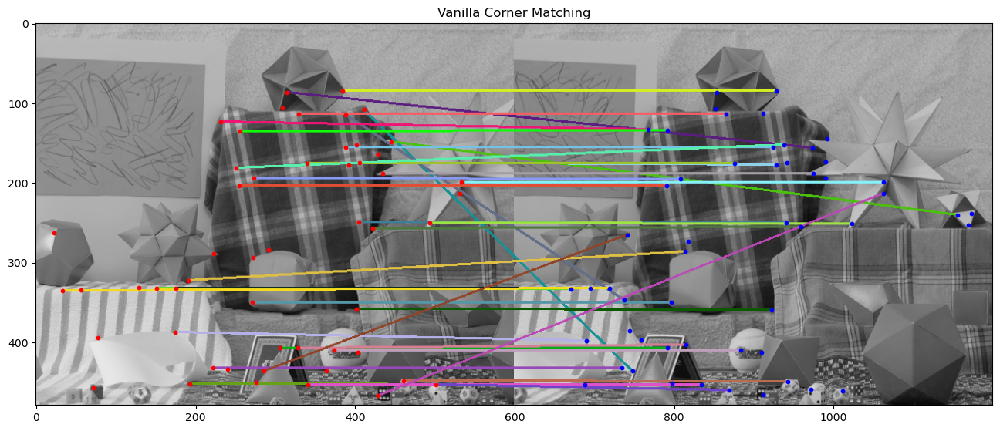

Number of matches 36


In [359]:
img1_path = 'images/view0.tif'
img2_path = 'images/view6.tif'

img_view0 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
img_view6 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

find_matches(img_view0, img_view6, patch_size=9, threshold=0, display=True, save=True, filename='images/case_2_matched_image.jpg', descriptor='patch_im', patch_match='NCC')

**Section B Question 3** 

Use up to 4000 of the strongest corners (you can use fewer) in each image and use the matching only between corners that have approximately the same y-coordinate (up to a threshold).

In [360]:
def find_matches_limit_y(im1, im2, patch_size, threshold=0, display=False, save=False, filename=None, descriptor='patch_im', patch_match='NCC'):

    #find a list of corners in both images and preprosses them
    corners_1 = filterd_corners(im1, patch_size)
    corners_2 = filterd_corners(im2, patch_size)

    M1 = create_patch_matrix(im1, corners_1, patch_size, descriptor)
    M2 = create_patch_matrix(im2, corners_2, patch_size, descriptor)
    
    NCC_matrix = create_ncc_matrix(M1, M2)

    # Calculate the indices of the maximum absolute value for each row
    indices = np.argmax(NCC_matrix, axis=1)

    # Exclude values below the threshold
    mask = NCC_matrix[np.arange(len(NCC_matrix)), indices] < threshold
    indices[mask] = -1

    for i in range(len(indices)):
        if indices[i] != -1:
            # Find all rows with the same maximum index
            # Select the row with the largest adjusted value from abs_matrix
            # and update max_indices to contain -1 for other rows with the same index
            y1 = corners_1[i][1]
            y2 = corners_2[indices[i]][1]

            # limit |y1 -y2|
            y_threshold = 2
            if abs(y1 - y2) <= y_threshold:
                same_indices = np.where(indices == indices[i])[0]            
                row = same_indices[np.argmax(NCC_matrix[same_indices, indices[i]])]
                mask = same_indices != row
                indices[same_indices[mask]] = -1
            else:
                indices[i] = -1

    #Save image and Dislpay
    if display:
        imC1 = np.dstack([im1,im1,im1])
        imC2 = np.dstack([im2,im2,im2])
        imC = cv2.hconcat([imC1, imC2])
        for i in range(len(indices)):
            if indices[i] == -1:
                continue
            else:
                x1, y1 = corners_1[i]
                x2, y2 = corners_2[indices[i]]
                imC = cv2.line(imC, (x1, y1), (x2 + int(imC1.shape[1]), y2), (np.random.randint(0,255),np.random.randint(0,255),np.random.randint(0,255)), 2) 

            
        for corner in corners_1:
            x, y = corner
            plt.scatter(int(x), int(y), s=10, c='r', marker='o')

        for corner in corners_2:
            x, y = corner
            plt.scatter(int(x)+ int(imC1.shape[1]), int(y), s=10, c='blue', marker='o')
        
        if save and filename:
            cv2.imwrite(filename, imC)
        
        plt.imshow(imC, cmap='gray')
        plt.title('Y constraint for Corner Matching')
        plt.show()
        print(f'Number of matches {np.sum(indices != -1)}')

    return 

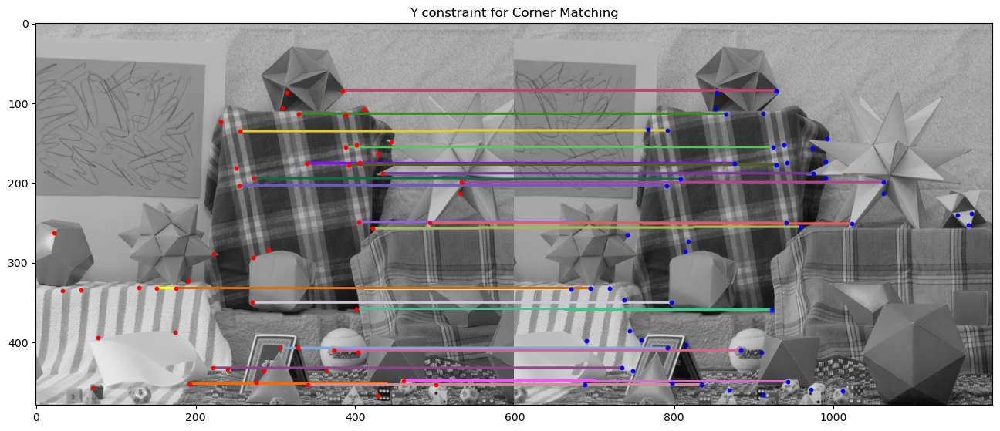

Number of matches 23


In [361]:
img1_path = 'images/view0.tif'
img2_path = 'images/view6.tif'

img_view0 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
img_view6 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

find_matches_limit_y(img_view0, img_view6, patch_size=9, threshold=0, display=True, save=True, filename='images/matched_image_limit_y.jpg', descriptor='patch_im', patch_match='NCC')

**Section B Question 4** 

Study the ratio for matching between the best and the second best match. 
   * You can use NCC or SSD on the desriptor of your choice.
   * You can use with (2) or with (3) the $y$-coordinate constraint.
   * **Present** examples that demonstrate the effectiveness of using the ratio.


In [362]:
def ratio_test_matches(im1, im2, patch_size, ratio_threshold=0.8, ncc_threshold=0.8, y_threshold=2, display=False, descriptor='patch_im', save=False,filename=None):
    # Find corners and create patch matrices
    corners_1 = filterd_corners(im1, patch_size)
    corners_2 = filterd_corners(im2, patch_size)

    M1 = create_patch_matrix(im1, corners_1, patch_size, descriptor)
    M2 = create_patch_matrix(im2, corners_2, patch_size, descriptor)
    
    # Compute NCC matrix
    NCC_matrix = create_ncc_matrix(M1, M2)
    
    # Calculate the indices and values of the best and second-best matches
    max_indices = np.argmax(NCC_matrix, axis=1)
    second_max_indices = np.argsort(NCC_matrix, axis=1)[:,-2]
    
    # Apply the ratio test and threshold
    match_count = 0
    final_matches = []
    for i in range(len(max_indices)):
        best_match_idx = max_indices[i]
        second_best_match_idx = second_max_indices[i]
        best_match_value = NCC_matrix[i, best_match_idx]
        second_best_match_value = NCC_matrix[i, second_best_match_idx]

        # if best_match_value < ncc_threshold or best_match_value / second_best_match_value < ratio_threshold:
        if best_match_value / second_best_match_value < ratio_threshold:
            continue

        # Apply y-coordinate constraint
        y1 = corners_1[i][1]
        y2 = corners_2[best_match_idx][1]
        if abs(y1 - y2) > y_threshold:
            continue

        # Ensure unique matching
        if best_match_idx not in [match[1] for match in final_matches]:
            final_matches.append((i, best_match_idx))
            match_count += 1
        
    #Save image and Dislpay
    if display:
        imC1 = np.dstack([im1,im1,im1])
        imC2 = np.dstack([im2,im2,im2])
        imC = cv2.hconcat([imC1, imC2])
        
        # Draw lines for final_matches
    for i, j in final_matches:
        x1, y1 = corners_1[i]
        x2, y2 = corners_2[j]
        color = (np.random.randint(0, 255), np.random.randint(0, 255), np.random.randint(0, 255))
        cv2.line(imC, (x1, y1), (x2 + imC1.shape[1], y2), color, 2)
            
        # Mark corners in the first image
    for corner in corners_1:
        x, y = corner
        plt.scatter(int(x), int(y), s=5, c='r', marker='o')

        # Mark corners in the second image
    for corner in corners_2:
        x, y = corner
        plt.scatter(int(x)+ int(imC1.shape[1]), int(y), s=5, c='blue', marker='o')   
    
    # Save the image
    if save and filename:
        cv2.imwrite(filename, imC)
        
    # Display the image
    plt.imshow(imC, cmap='gray')
    plt.title('Matches with Ratio Test')
    plt.show()
    print(f'Number of matches: {match_count}')

    return

In [373]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

def ratio_test_matches(im1, im2, patch_size, ratio_threshold=0.8, ncc_threshold=0.8, display=False, descriptor='patch_im', save=False, filename=None):
    # Find corners and create patch matrices
    corners_1 = filterd_corners(im1, patch_size)
    corners_2 = filterd_corners(im2, patch_size)

    M1 = create_patch_matrix(im1, corners_1, patch_size, descriptor)
    M2 = create_patch_matrix(im2, corners_2, patch_size, descriptor)

    # Compute NCC matrix
    NCC_matrix = create_ncc_matrix(M1, M2)

    # Calculate the indices and values of the best and second-best matches
    max_values = np.max(NCC_matrix, axis=1)
    sorted_indices = np.argsort(NCC_matrix, axis=1)
    max_indices = sorted_indices[:, -1]
    second_max_indices = sorted_indices[:, -2]
    second_max_values = np.array([NCC_matrix[i, second_max_indices[i]] for i in range(len(max_indices))])

    # Apply the ratio test and threshold
    match_count = 0
    final_matches = []
    for i, (best_match_value, second_best_match_value) in enumerate(zip(max_values, second_max_values)):
        # Continue if the ratio test fails
        if best_match_value < ncc_threshold or (best_match_value / second_best_match_value) < ratio_threshold:
            continue

        best_match_idx = max_indices[i]

        # Ensure unique matching
        if best_match_idx not in [match[1] for match in final_matches]:
            final_matches.append((i, best_match_idx))
            match_count += 1

    # Display and save results if required
    if display or save:
        imC1 = np.dstack([im1, im1, im1])
        imC2 = np.dstack([im2, im2, im2])
        imC = cv2.hconcat([imC1, imC2])

        for i, j in final_matches:
            x1, y1 = corners_1[i]
            x2, y2 = corners_2[j]
            color = (np.random.randint(0, 255), np.random.randint(0, 255), np.random.randint(0, 255))
            cv2.line(imC, (x1, y1), (x2 + imC1.shape[1], y2), color, 2)

        for corner in corners_1:
            x, y = corner
            plt.scatter(x, y, s=5, c='r', marker='o')

        for corner in corners_2:
            x, y = corner
            plt.scatter(x + imC1.shape[1], y, s=5, c='blue', marker='o')

        if save and filename:
            cv2.imwrite(filename, imC)

        if display:
            plt.imshow(imC, cmap='gray')
            plt.title('Matches with Ratio Test')
            plt.show()

    print(f'Number of matches: {match_count}')

    return

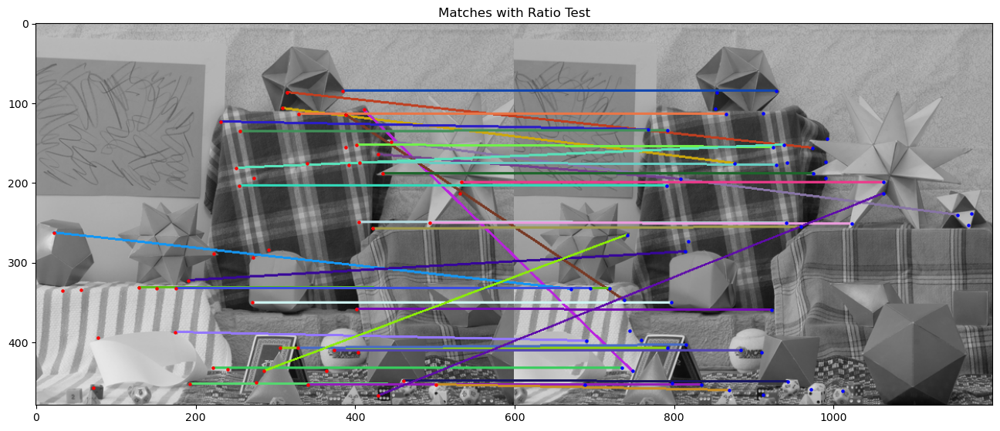

Number of matches: 36


In [377]:
img1_path = 'images/view0.tif'
img2_path = 'images/view6.tif'

img_view0 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)
img_view6 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)

ratio_test_matches(img_view0, img_view6, patch_size=9, ratio_threshold=0.99, ncc_threshold=0, display=True, save=True, filename='images/case4_ratio.jpg', descriptor='patch_im')
#ratio_test_matches(img_view0, img_view6, patch_size=9, ratio_threshold=0.8, ncc_threshold=0.8, y_threshold=2, display=True, save=True, filename='images/case4_ratio.jpg', descriptor='patch_im')

**Section B Question 5** 

Study the differences between the different descriptors and also the use of SSD or NCC. 
   * **Present**  examples that demonstrate your findings.

Using the NCC for descriptor similarity and the patch_im descriptor, No Y coordinate or ratio constraint


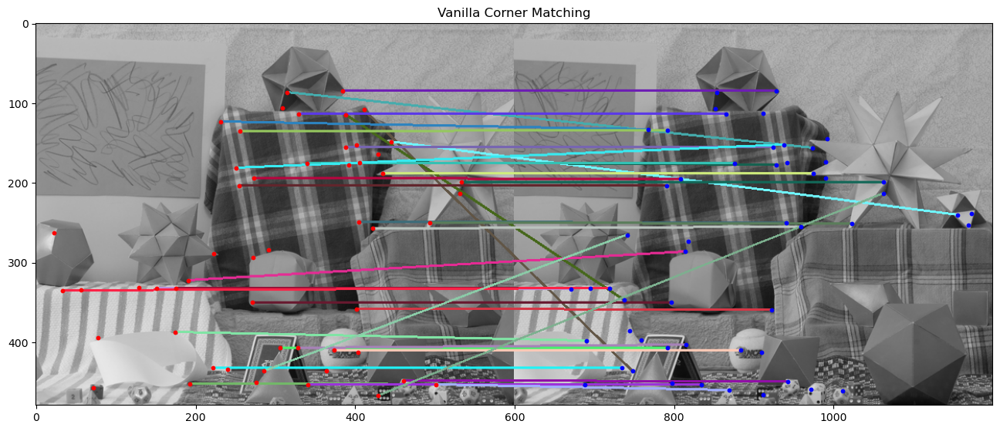

Number of matches 36

Using the NCC for descriptor similarity and the hist_im descriptor, No Y coordinate or ratio constraint


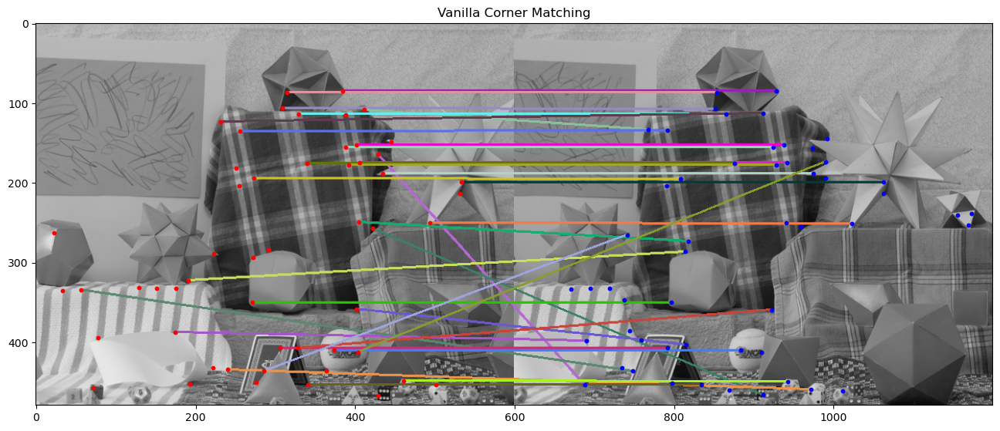

Number of matches 32

Using the NCC for descriptor similarity and the grad descriptor, No Y coordinate or ratio constraint


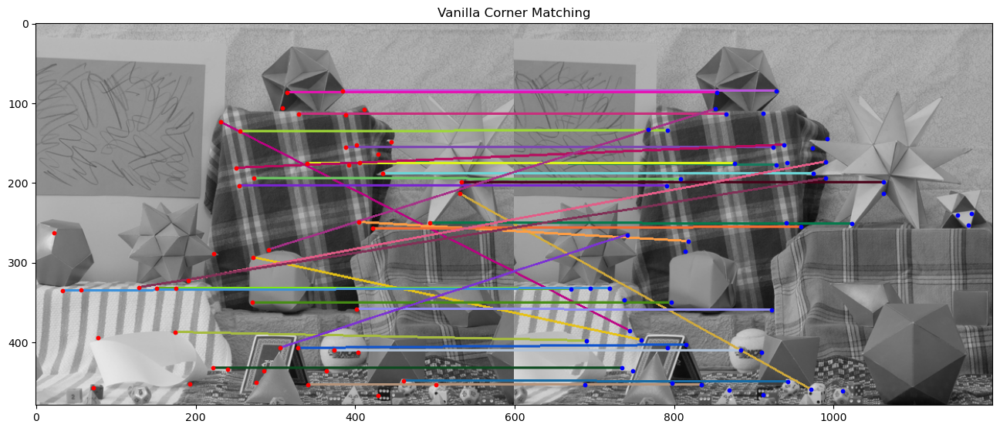

Number of matches 33

Using the NCC for descriptor similarity and the hist_grad descriptor, No Y coordinate or ratio constraint


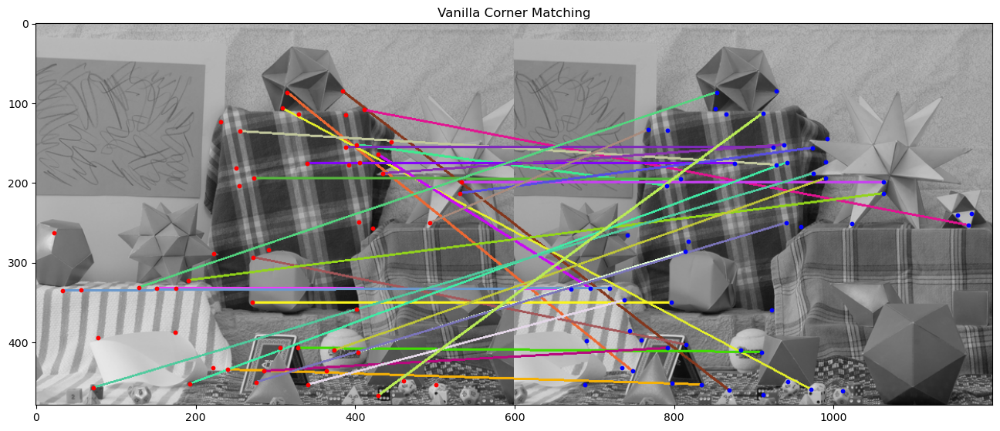

Number of matches 30


In [293]:
# In all 4 different descriptors we first check NCC:
print("Using the NCC for descriptor similarity and the patch_im descriptor, No Y coordinate or ratio constraint")
find_matches(img_view0, img_view6, patch_size=9, threshold=0, display=True,save=False, filename=None, descriptor='patch_im', patch_match='NCC')

print("\nUsing the NCC for descriptor similarity and the hist_im descriptor, No Y coordinate or ratio constraint")
find_matches(img_view0, img_view6, patch_size=9, threshold=0, display=True,save=False, filename=None, descriptor='hist_im', patch_match='NCC')

print("\nUsing the NCC for descriptor similarity and the grad descriptor, No Y coordinate or ratio constraint")
find_matches(img_view0, img_view6, patch_size=9, threshold=0, display=True,save=False, filename=None, descriptor='grad', patch_match='NCC')

print("\nUsing the NCC for descriptor similarity and the hist_grad descriptor, No Y coordinate or ratio constraint")
find_matches(img_view0, img_view6, patch_size=9, threshold=0, display=True,save=False, filename=None, descriptor='hist_grad', patch_match='NCC')

Using the SSD for descriptor similarity and the patch_im descriptor, No Y coordinate or ratio constraint


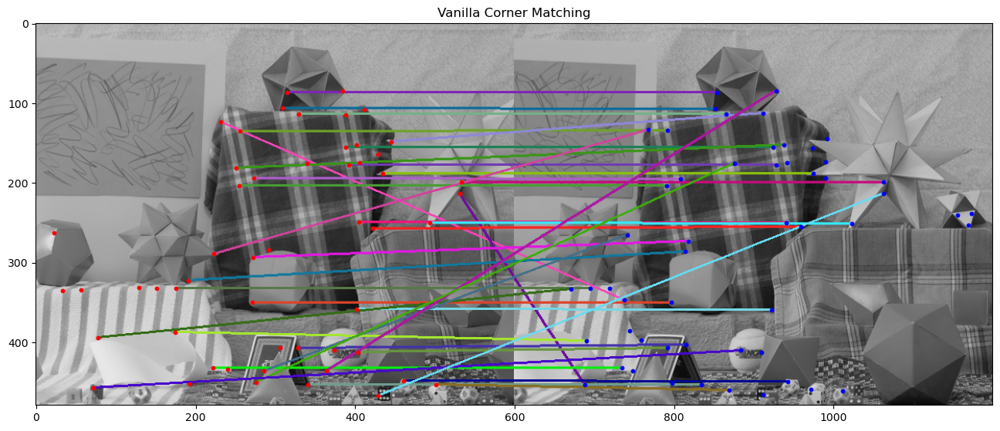

Number of matches 36

Using the SSD for descriptor similarity and the hist_im descriptor, No Y coordinate or ratio constraint


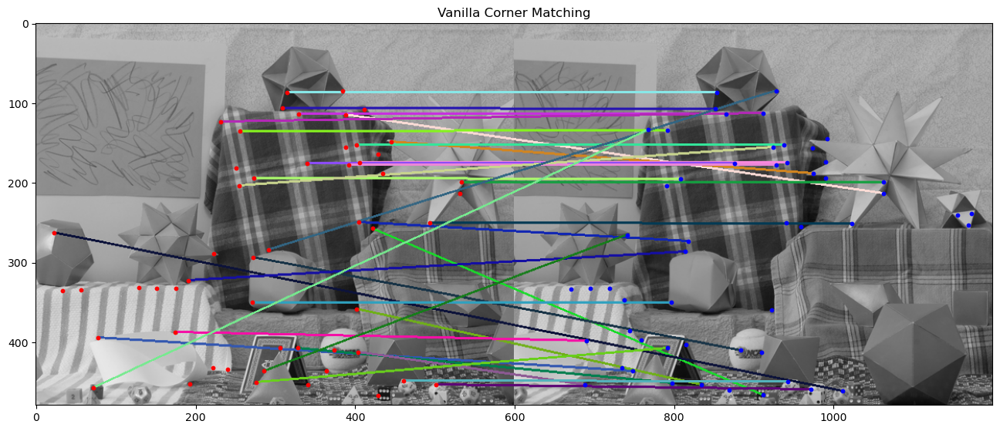

Number of matches 32

Using the SSD for descriptor similarity and the grad descriptor, No Y coordinate or ratio constraint


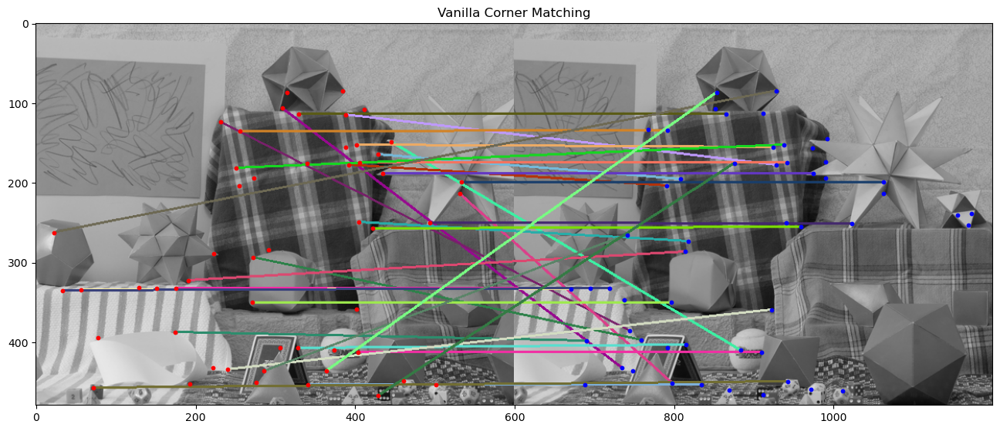

Number of matches 33

Using the SSD for descriptor similarity and the hist_grad descriptor, No Y coordinate or ratio constraint


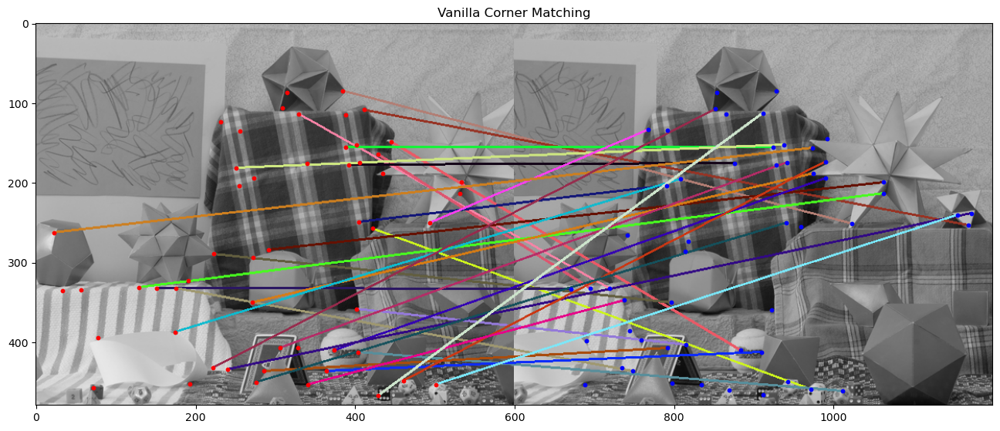

Number of matches 32


In [294]:
# In all 4 different descriptors we then check SSD:
print("Using the SSD for descriptor similarity and the patch_im descriptor, No Y coordinate or ratio constraint")
find_matches(img_view0, img_view6, patch_size=9, threshold=0, display=True,save=False, filename=None, descriptor='patch_im', patch_match='SSD')

print("\nUsing the SSD for descriptor similarity and the hist_im descriptor, No Y coordinate or ratio constraint")
find_matches(img_view0, img_view6, patch_size=9, threshold=0, display=True,save=False, filename=None, descriptor='hist_im', patch_match='SSD')

print("\nUsing the SSD for descriptor similarity and the grad descriptor, No Y coordinate or ratio constraint")
find_matches(img_view0, img_view6, patch_size=9, threshold=0, display=True,save=False, filename=None, descriptor='grad', patch_match='SSD')

print("\nUsing the SSD for descriptor similarity and the hist_grad descriptor, No Y coordinate or ratio constraint")
find_matches(img_view0, img_view6, patch_size=9, threshold=0, display=True,save=False, filename=None, descriptor='hist_grad', patch_match='SSD')

**Section B Question 6** 

Identify incorrect pairs of matched points.\
   **Mark and display** for cases (2), (3), and (4) a pair of incorrectly matched points.\
   **Answer**\
   a. In which of the 3 cases are there more incorrect matches?\
   b. What may be the reason for the incorrect matches?

In case 2:

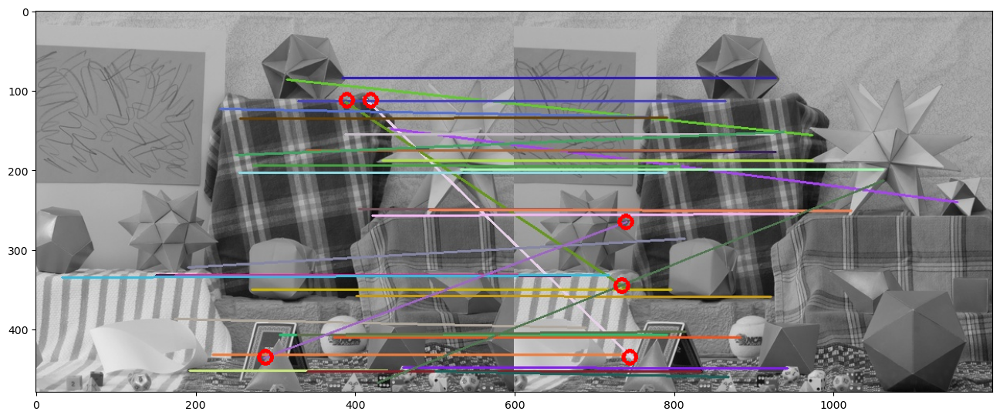

In [364]:
image_2 = cv2.imread('images/case_2_matched_image.jpg')

corner_list = [(288, 435),(740, 265),(390, 112),(735, 345),(745, 435),(420, 112)]

# Circle parameters (radius, color, thickness)
circle_radius = 8  # Adjust the radius as needed
circle_color = (0, 0, 255)  # BGR color (red in this example)
circle_thickness = 3  # Adjust the thickness as needed

# Iterate through the list and draw circles for each corner
for corner in corner_list:
    corner_x, corner_y = corner
    circle_center = (corner_x, corner_y)
    image_2 = cv2.circle(image_2, circle_center, circle_radius, circle_color, circle_thickness)

# Display the image with circles
plt.imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))
plt.show()

In case 3:

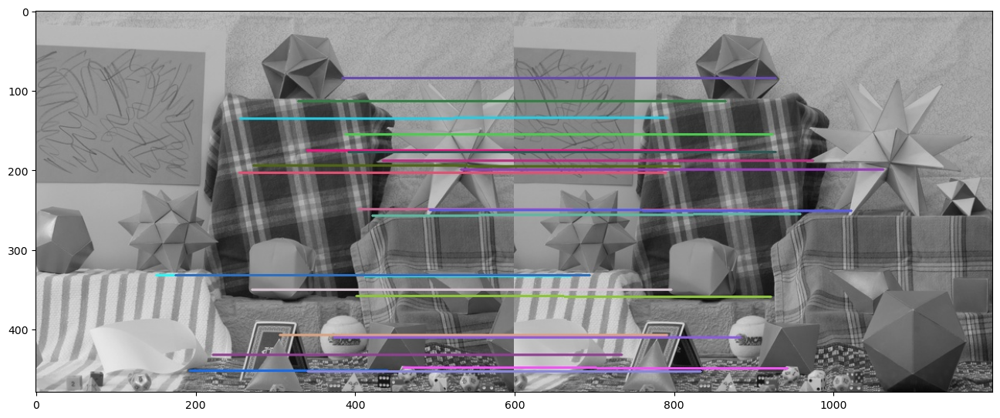

In [367]:
image_3 = cv2.imread('images/matched_image_limit_y.jpg')

corner_list = []

# Circle parameters (radius, color, thickness)
circle_radius = 8  # Adjust the radius as needed
circle_color = (0, 0, 255)  # BGR color (red in this example)
circle_thickness = 3  # Adjust the thickness as needed

# Iterate through the list and draw circles for each corner
for corner in corner_list:
    corner_x, corner_y = corner
    circle_center = (corner_x, corner_y)
    image_3 = cv2.circle(image_3, circle_center, circle_radius, circle_color, circle_thickness)

# Display the image with circles
plt.imshow(cv2.cvtColor(image_3, cv2.COLOR_BGR2RGB))
plt.show()

In case 4:

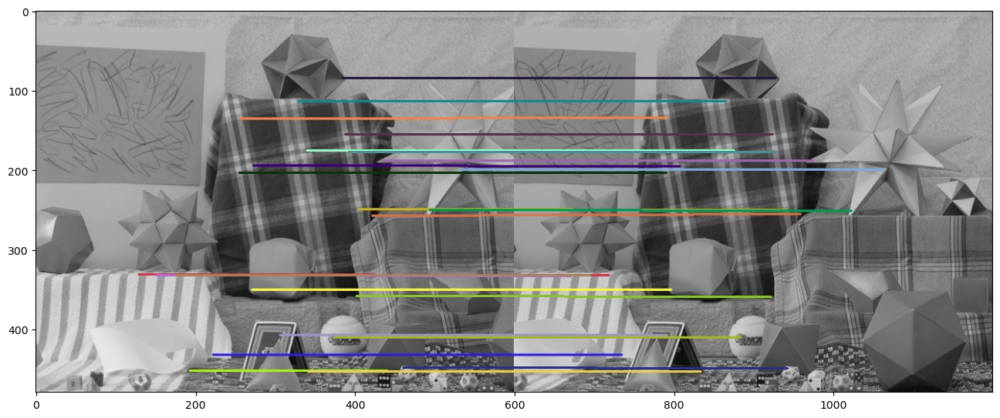

In [318]:
image_4 = cv2.imread('images/case4_ratio.jpg')

corner_list = []
#[(150, 333),(175, 333),(190, 450),(445, 450)]

# Circle parameters (radius, color, thickness)
circle_radius = 8  # Adjust the radius as needed
circle_color = (0, 0, 255)  # BGR color (red in this example)
circle_thickness = 3  # Adjust the thickness as needed

# Iterate through the list and draw circles for each corner
for corner in corner_list:
    corner_x, corner_y = corner
    circle_center = (corner_x, corner_y)
    image_4 = cv2.circle(image_4, circle_center, circle_radius, circle_color, circle_thickness)

# Display the image with circles
plt.imshow(cv2.cvtColor(image_4, cv2.COLOR_BGR2RGB))
plt.show()

Case (2) have more incorrect matches as it doesn't employ additional constraints like y-coordinate or ratio tests.

What may be the reason for the incorrect matches?
<br>
Lack of Constraints: In case (2), without y-coordinate or ratio constraints, the matching relies solely on NCC values, which can lead to false positives in repetitive or similar textured regions.
Noise and Variations: If the images have noise, lighting variations, or non-linear intensity changes, it can lead to incorrect matches.
<br>
Descriptor Limitation: The choice of descriptor (patch image intensity, gradient, etc.) impacts the distinctiveness of features. If the descriptor isn't robust enough in differentiating unique features, it can result in mismatches.
<br>
Geometric Distortions: Any geometric distortions between the two images that are not accounted for can cause mismatches.

**Section B Question 7** 

In which regions of the scene were most of the reliable matches found?

In the two images discussed, the most reliable region is the plaid blankets.